In [1]:
import torch
from torch import nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [2]:
def render(
        kernel_size: int,
        sigma_x: torch.Tensor, # (N,)
        sigma_y: torch.Tensor, # (N,)
        rho: torch.Tensor, # (N,)
        coords: torch.Tensor, # (N, 2) ranging from -1 to 1
        colors: torch.Tensor, # (N, 3)
        image_size: tuple = (256, 256, 3),
    ):

    if (rho >= 1.).any():
        raise ValueError("Covariance matrix should be positive semi-definite")

    covar = torch.stack(
        [torch.stack([sigma_x**2., rho*sigma_x*sigma_y], dim=-1),
         torch.stack([rho*sigma_x*sigma_y, sigma_y**2.], dim=-1)],
        dim = 1
    )

    inv_covar = torch.inverse(covar) # (N, 2, 2)

    # Create meshgrid to assign each grid with (x, y)
    kernel = torch.linspace(-5., 5., kernel_size, device=colors.device)
    grid_x, grid_y = torch.meshgrid(kernel, kernel, indexing='xy')

    # Compute the color for each grid
    xy = torch.stack([grid_x, grid_y], dim=-1) # (k, k, 2)
    z = torch.exp(-0.5 * torch.einsum('xyi,nij,xyj->nxy', xy, inv_covar, xy)) # (N, k, k)

    z = z[:, :, :, None] * colors[:, None, None, :]

    # padding
    z = z.permute(0, 3, 1, 2) # (N, C, k, k)
    pad_h = image_size[0] - kernel_size
    pad_w = image_size[1] - kernel_size

    if pad_h < 0 or pad_w < 0:
        raise ValueError("Kernel size must be smaller or equal to the image size.")
    
    padding = (
        pad_w // 2, pad_w // 2 + pad_w % 2, # l r
        pad_h // 2, pad_h // 2 + pad_h % 2, # t b
    )

    z = F.pad(z, padding, "constant", 0) # (N, C, H, W)

    # compute translation matrices
    n, c, h, w = z.shape
    theta = torch.zeros(n, 2, 3, dtype=colors.dtype, device=colors.device)
    theta[:, 0, 0] = 1.
    theta[:, 1, 1] = 1.
    theta[:, :, 2] = coords

    # apply the matrices
    grid = F.affine_grid(theta, (n, c, h, w), align_corners=True)
    z = F.grid_sample(z, grid, align_corners=True)
    image = z.sum(dim=0) # (C, H, W)
    image = torch.clamp(image, 0, 1)
    image = image.permute(1, 2, 0)

    return image



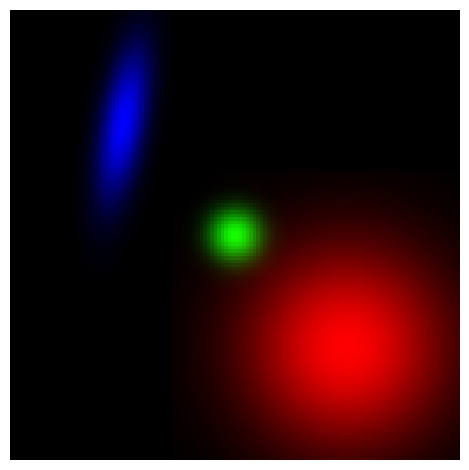

In [3]:
# test rendering
kernel_size = 100
rho = torch.tensor([0.0, 0.0, -0.5])
sigma_x = torch.tensor([2.0, 0.5, 0.5])
sigma_y = torch.tensor([2.0, 0.5, 1.5])
coords = torch.tensor([(-0.5, -0.5), (0., 0.), (0.5, 0.5)])
colors = torch.tensor([(1.0, 0.0, 0.0), (0.0, 1.0, 0.0), (0.0, 0.0, 1.0)])
image_size = (128, 128, 3)

image = render(kernel_size, sigma_x, sigma_y, rho, coords, colors, image_size)

plt.imshow(image.numpy())
plt.axis("off")
plt.tight_layout()

In [4]:
def create_window(window_size, channel):
    def gaussian(window_size, sigma):
        gauss = torch.exp(torch.tensor([-(x - window_size//2)**2/float(2*sigma**2) for x in range(window_size)]))
        return gauss/gauss.sum()

    _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
    _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
    window = torch.autograd.Variable(_2D_window.expand(channel, 1, window_size, window_size).contiguous())

    return window



def ssim(img1, img2, window_size=11, size_average=True):


    (_, _, channel) = img1.size()

    img1 = img1.unsqueeze(0).permute(0, 3, 1, 2)
    img2 = img2.unsqueeze(0).permute(0, 3, 1, 2)


    # Parameters for SSIM
    C1 = 0.01**2
    C2 = 0.03**2

    window = create_window(window_size, channel)

    if img1.is_cuda:
        window = window.cuda(img1.get_device())
    window = window.type_as(img1)

    mu1 = F.conv2d(img1, window, padding=window_size//2, groups=channel)
    mu2 = F.conv2d(img2, window, padding=window_size//2, groups=channel)
    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1 * mu2

    sigma1_sq = F.conv2d(img1*img1, window, padding=window_size//2, groups=channel) - mu1_sq
    sigma2_sq = F.conv2d(img2*img2, window, padding=window_size//2, groups=channel) - mu2_sq
    sigma12 = F.conv2d(img1*img2, window, padding=window_size//2, groups=channel) - mu1_mu2

    SSIM_numerator = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))
    SSIM_denominator = ((mu1_sq + mu2_sq + C1)*(sigma1_sq + sigma2_sq + C2))
    SSIM = SSIM_numerator / SSIM_denominator

    return torch.clamp((1 - SSIM) / 2, 0, 1)

def d_ssim_loss(img1, img2, window_size=11, size_average=True):
    return ssim(img1, img2, window_size, size_average).mean()

# Combined Loss
def combined_loss(pred, target, lambda_param=0.5):
    l1loss = nn.L1Loss()
    return (1 - lambda_param) * l1loss(pred, target) + lambda_param * d_ssim_loss(pred, target)

In [5]:
import yaml
# Load config
with open('config.yml', 'r') as f:
    config = yaml.safe_load(f)

KERNEL_SIZE = config["KERNEL_SIZE"]
image_size = tuple(config["image_size"])
primary_samples = config["primary_samples"]
backup_samples = config["backup_samples"]
num_epochs = config["num_epochs"]
densification_interval = config["densification_interval"]
learning_rate = config["learning_rate"]
image_file_name = config["image_file_name"]
display_interval = config["display_interval"]
grad_threshold = config["gradient_threshold"]
gauss_threshold = config["gaussian_threshold"]
display_loss = config["display_loss"]
scale_reduction_factor = config["scale_reduction_factor"]

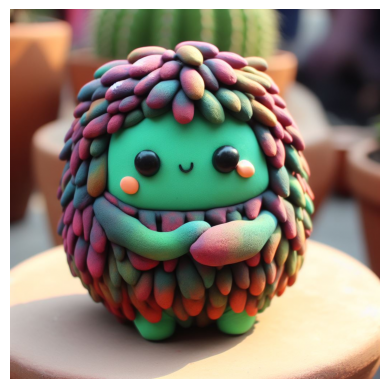

In [6]:
# load data
from PIL import Image
import numpy as np
target_image = np.array(Image.open(image_file_name)) / 255.
plt.axis("off")
plt.imshow(target_image)

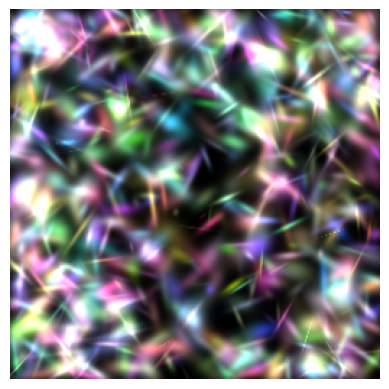

In [7]:
from torch import optim
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# init
torch.manual_seed(2024)

params = torch.randn(primary_samples + backup_samples, 9)
params = nn.Parameter(params.to(device))

optimizer = optim.Adam([params], learning_rate)

def render_helper(params: torch.Tensor, valid_mask: torch.Tensor):
    valid_params = params[valid_mask]

    sigma_x = torch.sigmoid(valid_params[:, 0])
    sigma_y = torch.sigmoid(valid_params[:, 1])
    rho = torch.tanh(valid_params[:, 2])
    coords = torch.tanh(valid_params[:, 3:5])
    colors = torch.sigmoid(valid_params[:, 5:8])
    alpha = torch.sigmoid(valid_params[:, 8])

    colors = colors * alpha[:, None]

    return render(KERNEL_SIZE, sigma_x, sigma_y, rho, coords, colors, image_size)

valid_mask = torch.zeros(primary_samples + backup_samples, dtype=bool).to(device)
valid_mask[:primary_samples] = True
image = render_helper(params, valid_mask=valid_mask)

plt.axis("off")
plt.imshow(image.detach().cpu().numpy())


/home/x/xie77777/miniconda3/envs/gaussian_splatting/lib/python3.8/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Epoch 100/2000: loss=0.07144032418727875 with 1000 Gaussians.


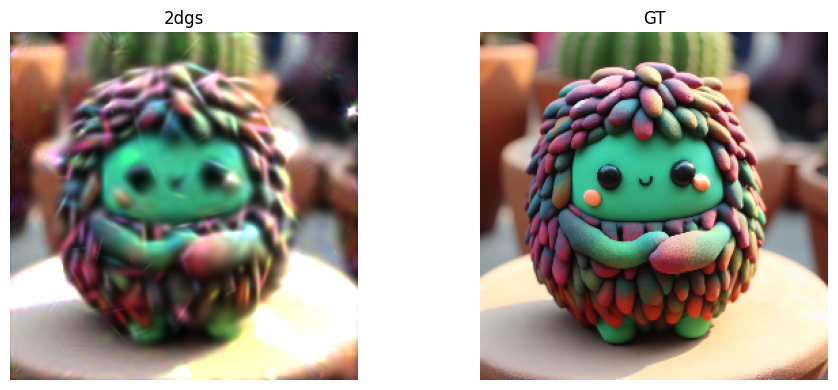

Epoch 200/2000: loss=0.04938109219074249 with 1000 Gaussians.


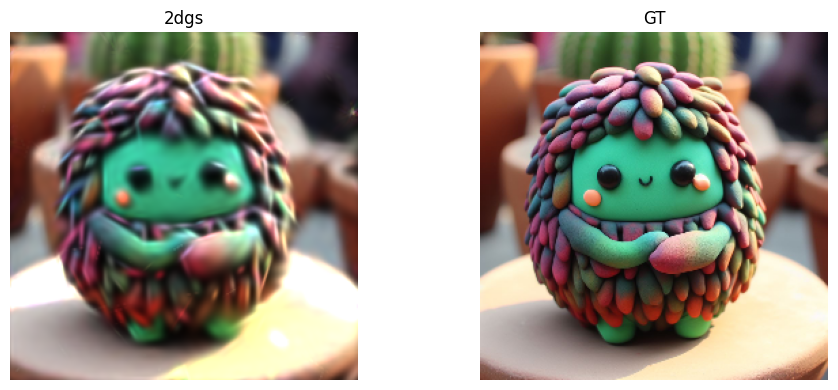

Number of points to remove: 15
Number of descaled gaussians: 91
Number of cloned gaussians: 91
Epoch 300/2000: loss=0.0426204614341259 with 1076 Gaussians.


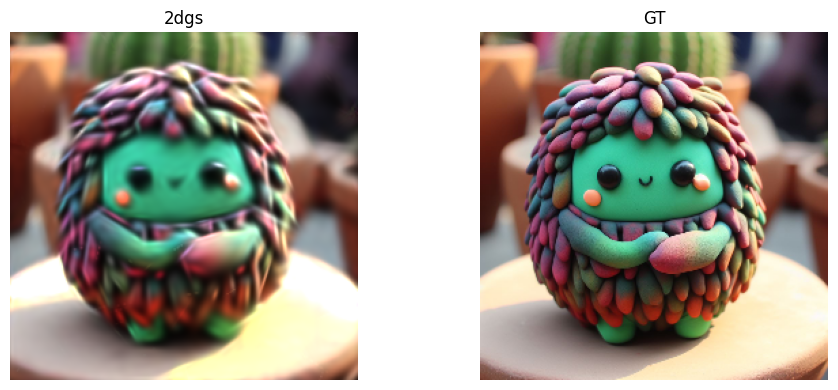

Epoch 400/2000: loss=0.036662958562374115 with 1076 Gaussians.


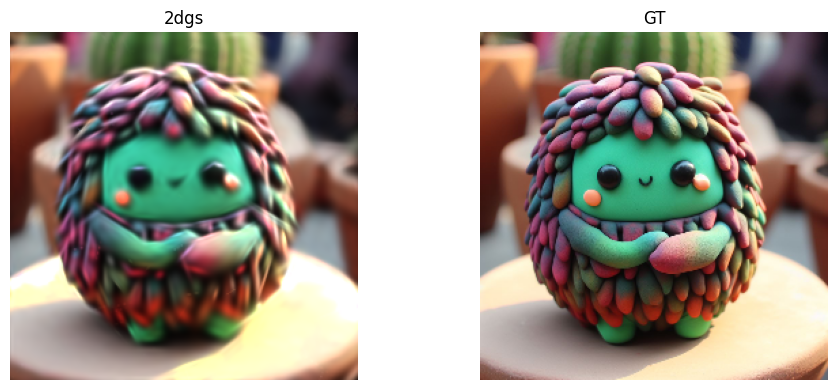

Epoch 500/2000: loss=0.03390135616064072 with 1076 Gaussians.


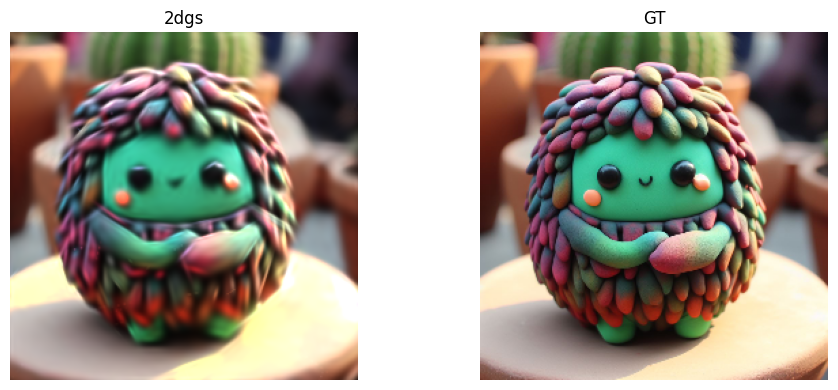

Number of points to remove: 4
Number of descaled gaussians: 162
Number of cloned gaussians: 162
Epoch 600/2000: loss=0.032593563199043274 with 1234 Gaussians.


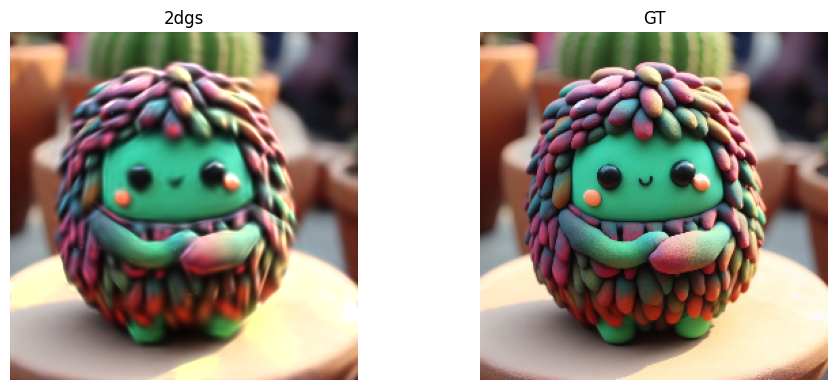

Epoch 700/2000: loss=0.030191339552402496 with 1234 Gaussians.


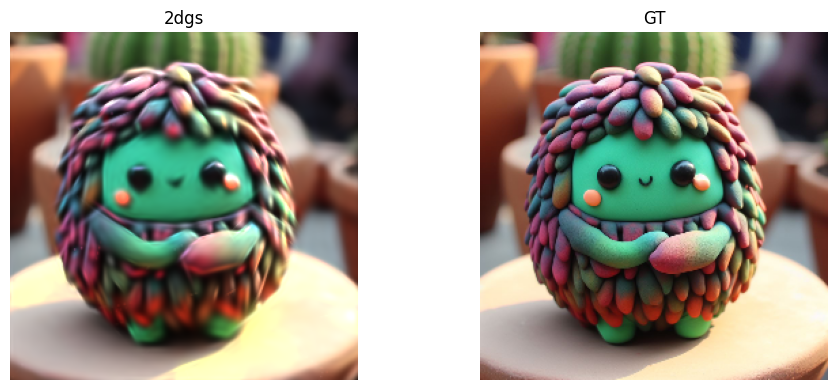

Epoch 800/2000: loss=0.028923938050866127 with 1234 Gaussians.


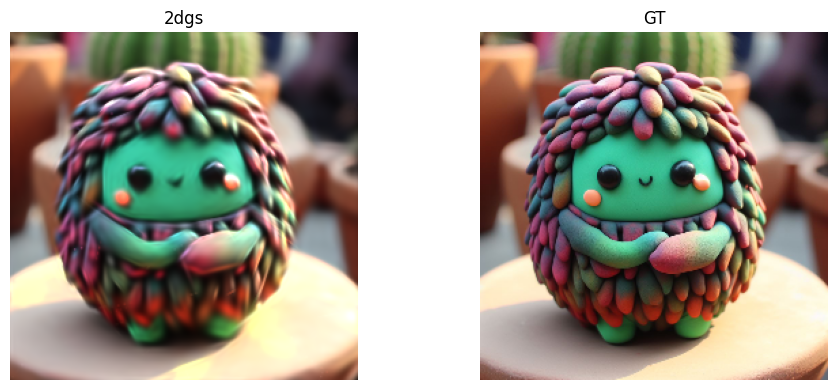

Number of points to remove: 6
Number of descaled gaussians: 220
Number of cloned gaussians: 220
Epoch 900/2000: loss=0.027990881353616714 with 1448 Gaussians.


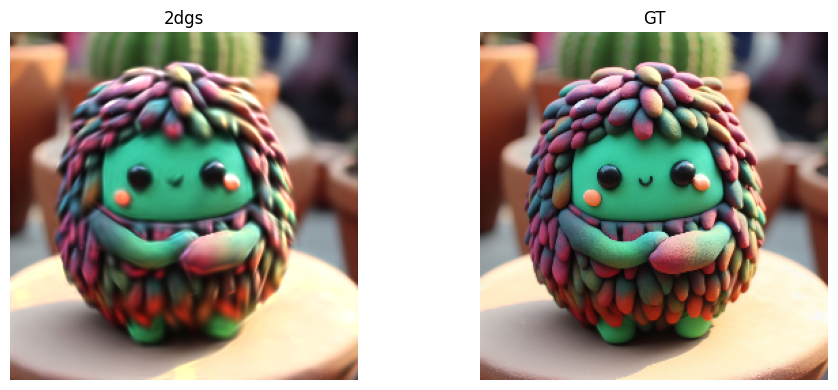

Epoch 1000/2000: loss=0.026352761313319206 with 1448 Gaussians.


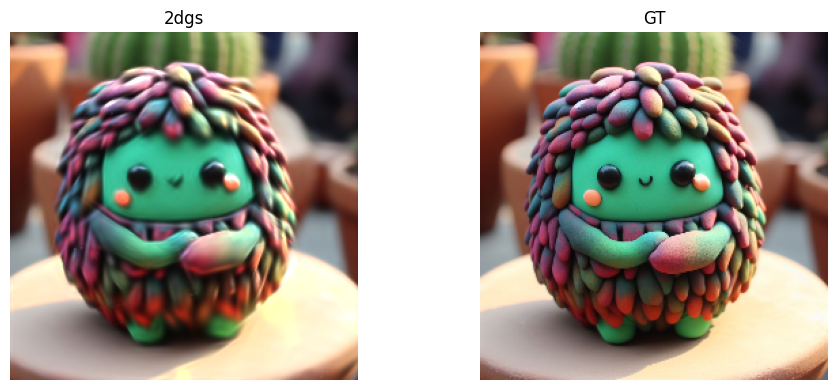

Epoch 1100/2000: loss=0.024882730096578598 with 1448 Gaussians.


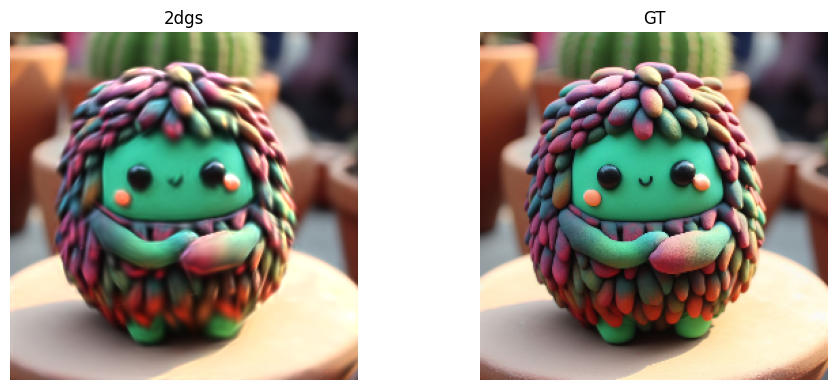

Number of points to remove: 7
Number of descaled gaussians: 198
Number of cloned gaussians: 198
Epoch 1200/2000: loss=0.024051358923316002 with 1639 Gaussians.


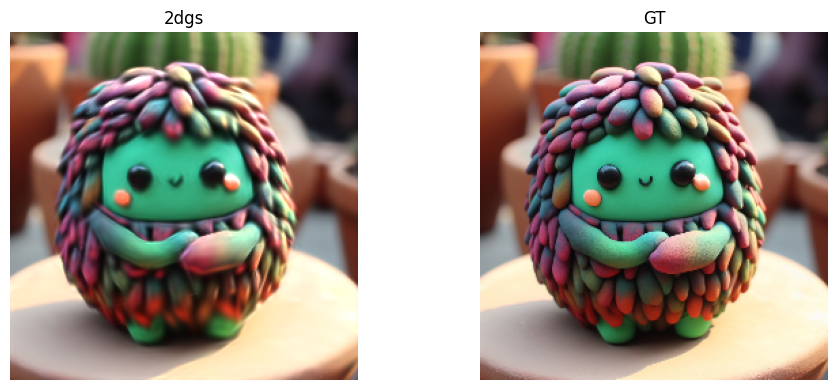

Epoch 1300/2000: loss=0.023217596113681793 with 1639 Gaussians.


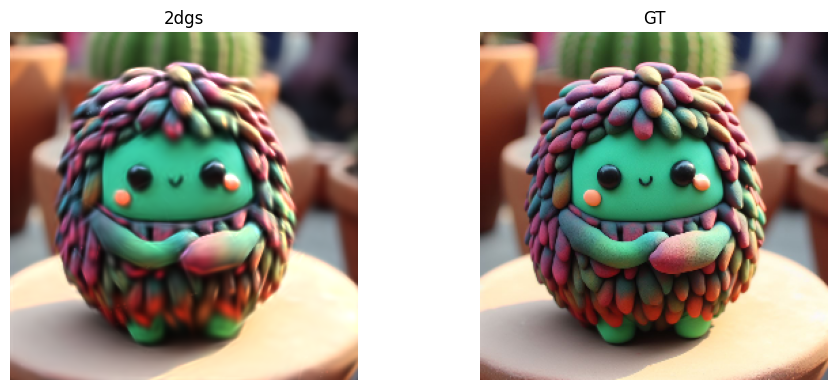

Epoch 1400/2000: loss=0.02235712669789791 with 1639 Gaussians.


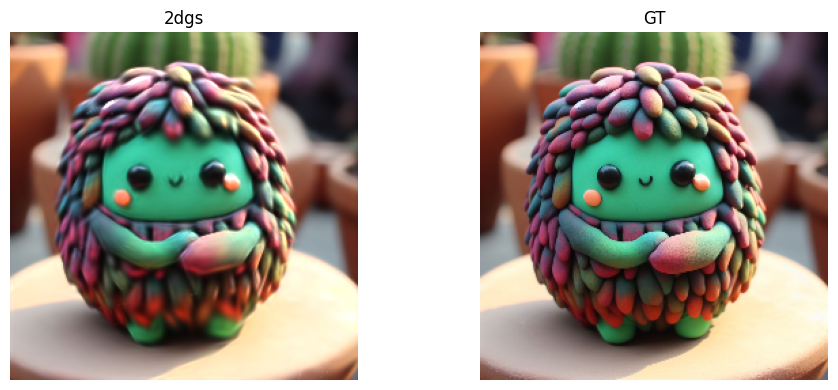

Number of points to remove: 8
Number of descaled gaussians: 209
Number of cloned gaussians: 209
Epoch 1500/2000: loss=0.02193162404000759 with 1840 Gaussians.


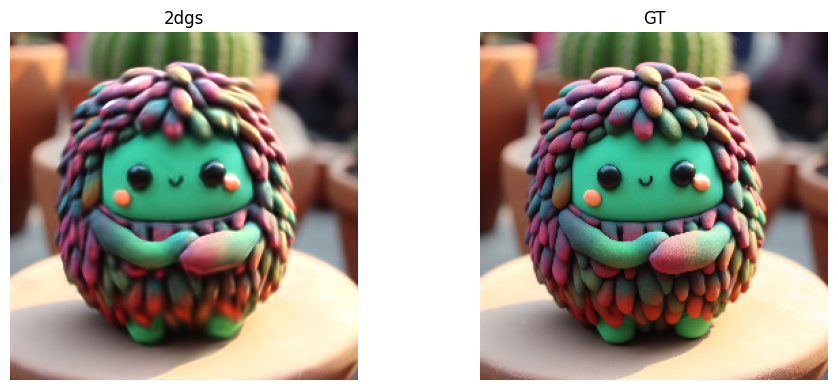

Epoch 1600/2000: loss=0.021266411989927292 with 1840 Gaussians.


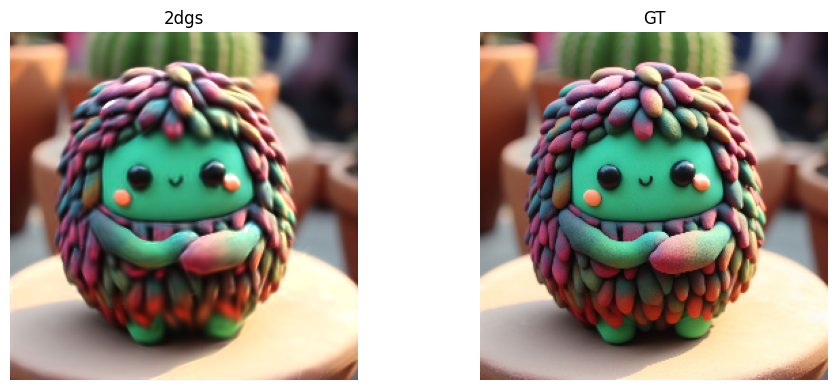

Epoch 1700/2000: loss=0.020300421863794327 with 1840 Gaussians.


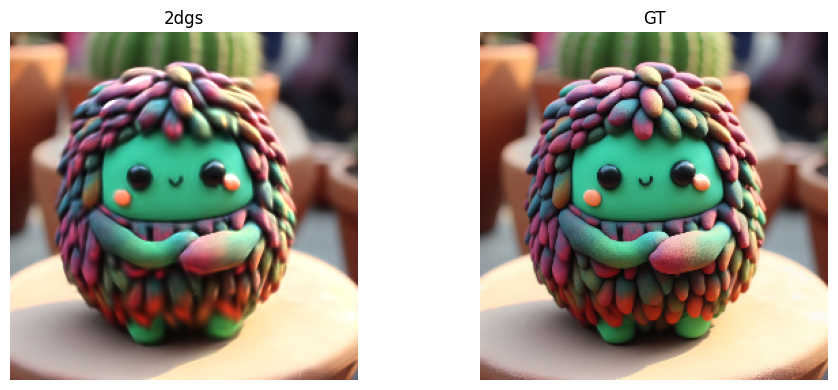

Number of points to remove: 12
Number of descaled gaussians: 240
Number of cloned gaussians: 240
Epoch 1800/2000: loss=0.01986430026590824 with 2068 Gaussians.


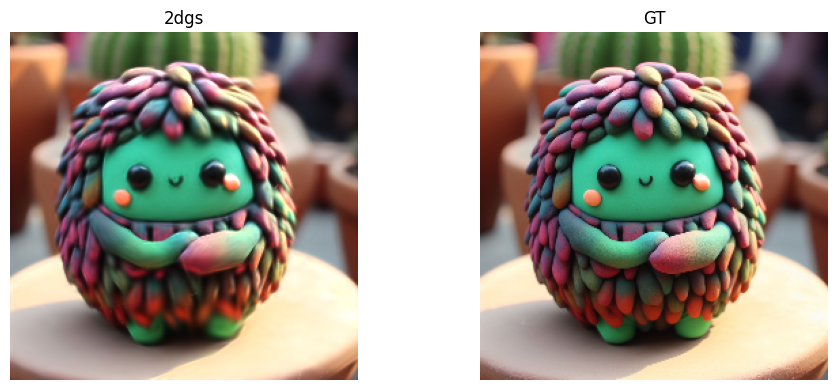

Epoch 1900/2000: loss=0.01962604746222496 with 2068 Gaussians.


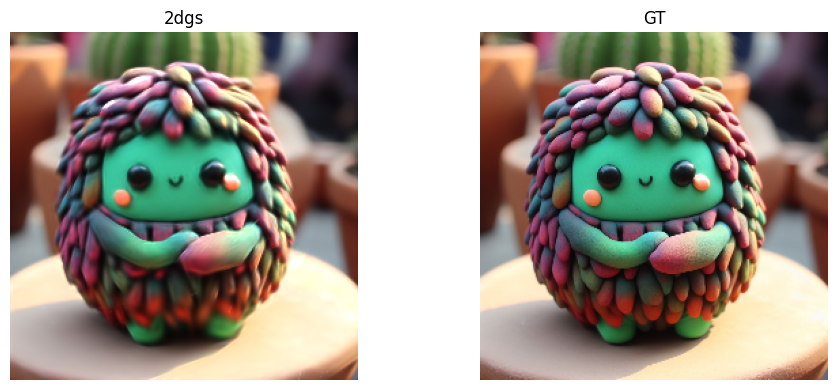

Epoch 2000/2000: loss=0.018799036741256714 with 2068 Gaussians.


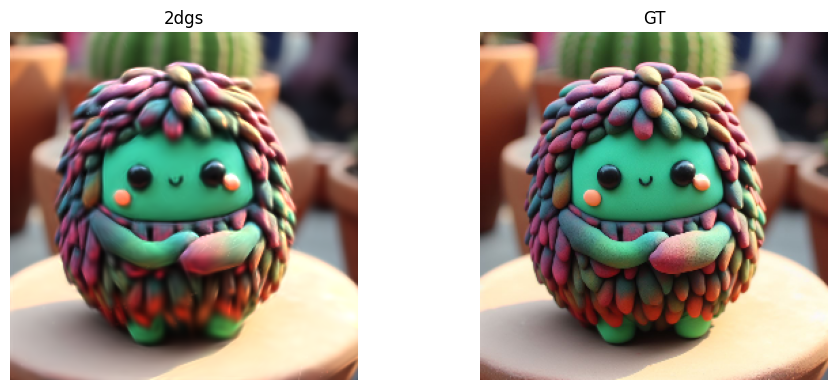

Excution time: 0:08:11.453432


In [8]:
from datetime import datetime
import torchvision.transforms.functional as vF

st = datetime.now()

# train loop
queue = torch.arange(primary_samples, backup_samples)
queue = queue.to(device)
target_image = torch.tensor(target_image, dtype=params.dtype).to(device).permute(2, 0, 1)
target_image = vF.resize(target_image, [256, 256]).permute(1, 2, 0)
for epoch in range(1, num_epochs + 1):
    
    if epoch % densification_interval == 0:
        # remove gaussians with small alpha value
        indices_to_remove = torch.logical_and(torch.sigmoid(params[:, 8]) < 0.1, valid_mask).nonzero().squeeze()
        if indices_to_remove.dim() > 0:
            print(f"Number of points to remove:", indices_to_remove.shape[0])

            valid_mask[indices_to_remove] = False
            queue = torch.cat([queue, indices_to_remove], dim=0)

    torch.cuda.empty_cache()
        
    image = render_helper(params, valid_mask)
    # print(image.shape, target_image.shape)
    loss = combined_loss(image, target_image)

    optimizer.zero_grad()
    loss.backward()

    params.grad.data[~valid_mask] = 0.0

    if epoch % densification_interval == 0:
        grad_norms = torch.norm(params.grad[:, 3:5], dim=1, p=2)
        gaussian_norms = torch.norm(torch.sigmoid(params[:, 0:2]), dim=1, p=2)

        large_grad_indices = torch.logical_and(valid_mask, grad_norms > grad_threshold)
        large_gauss_indices = torch.logical_and(valid_mask, gaussian_norms > gauss_threshold)

        # under_indices = torch.logical_and(large_grad_indices, ~large_gauss_indices).nonzero().squeeeze()
        # over_indices = torch.logical_and(large_grad_indices, large_gauss_indices).nonzero().squeeze()
        descale_indices = torch.logical_and(large_grad_indices, large_gauss_indices).nonzero().squeeze()

        if descale_indices.dim() > 0:
            print("Number of descaled gaussians:", descale_indices.shape[0])
            params.data[descale_indices, 0:2]  /= scale_reduction_factor
        
        cloned_indices = large_grad_indices.nonzero().squeeze()
        if cloned_indices.dim() > 0:
            n = min(cloned_indices.shape[0], queue.shape[0])
            print("Number of cloned gaussians:", n)
            params.data[queue[:n]] = params.data[cloned_indices[:n]]
            params.data[queue[:n], 3:5] -= params.grad.data[cloned_indices[:n], 3:5] * 0.1
            valid_mask[queue[:n]] = True
            queue = queue[n:]
    
    optimizer.step()
        
    if epoch % display_interval == 0:
        print(f"Epoch {epoch}/{num_epochs}: loss={loss.item()} with {valid_mask.count_nonzero()} Gaussians.")
        
        fig, axs = plt.subplots(1, 2, figsize=(10, 4))

        axs[0].imshow(image.detach().cpu().numpy())
        axs[0].set_title("2dgs")
        axs[0].axis("off")

        axs[1].imshow(target_image.detach().cpu().numpy())
        axs[1].set_title("GT")
        axs[1].axis("off")
        
        plt.tight_layout()

        plt.show()

runtime = datetime.now() - st
print(f"Excution time: {runtime}")